### analysis - Mach

In [1]:
import networkx as nx

In [2]:
G = nx.read_gexf('data/G_merged.gexf')

In [5]:
# add node degree as a node attribute
for n in G.nodes():
    G.nodes[n]['degree'] = G.degree(n)

In [7]:
# select subgraph without leaves
G2 = G.subgraph([n for n in G.nodes() if G.degree(n) > 1])

In [9]:
# assortativity 
print(nx.attribute_assortativity_coefficient(G2, attribute='degree'))

-0.0019268646875704187


In [3]:
# assortativity 
print(nx.attribute_assortativity_coefficient(G, attribute='cited_by'))

-0.0002470554544772078


In [4]:
print(nx.degree_assortativity_coefficient(G))

0.00957538180768538


In [3]:
connections_to_Mach = []
with open('data/potential_connections_Mach.txt', 'r') as f:
    potential_connections = f.read().splitlines()
    
    # find whether the potential connections are in the graph authors
    for pc in potential_connections:
        for n in G.nodes():
            
            try:
                if pc in G.nodes[n]['authors']:
                    # print distance between the Mach paper and the potential connection
                    conn, dist = G.nodes[n], nx.shortest_path_length(G, n, '10510889753822385821')
                    # print(pc, conn, dist)
                    connections_to_Mach.append((conn, dist))
            except:
                pass
                # print('error: ', n)               

print(len(connections_to_Mach))
        

30


In [4]:
for conn, dist in connections_to_Mach:
    if dist == 1:
        print(conn, dist)

{'url': 'https://www.taylorfrancis.com/books/mono/10.4324/9780203992739/language-thought-child-jean-piaget', 'title': 'Language and Thought of the Child: Selected Works vol 5', 'authors': 'J Piaget', 'year': '2005', 'cited_by': 11293, 'cited_by_url': 'https://scholar.google.com/scholar?cites=12224115070662084473&as_sdt=2005&sciodt=0,5&hl=en', 'label': 'Language and Thought of the Child: Selected Works vol 5'} 1
{'url': 'https://books.google.com/books?hl=en&lr=&id=S9WNCwAAQBAJ&oi=fnd&pg=PT20&ots=Lmwu5jwDIX&sig=ePCQFlkqDs6zUrhYk5iEj-gqTpY', 'title': 'The behavior of organisms: An experimental analysis', 'authors': 'BF Skinner', 'year': '2019', 'cited_by': 17562, 'cited_by_url': 'https://scholar.google.com/scholar?cites=7591695040665396739&as_sdt=2005&sciodt=0,5&hl=en', 'label': 'The behavior of organisms: An experimental analysis'} 1


In [3]:
import pandas as pd

df = pd.read_csv('data\connections_to_Mach_filtered.csv')

In [41]:
df.head()

,url,title,authors,year,cited_by,cited_by_url,label,downloaded,Unnamed: 8,Unnamed: 9,Unnamed: 10
0,https://www.tandfonline.com/doi/abs/10.1080/02...,The brains concepts The role of the sensory mo...,V Gallese_G Lakoff,2005,3400,https://scholar.google.com/scholar?cites=42108...,The brain's concepts: The role of the sensory-...,1,The brains concepts The role of the sensory mo...,NaN,NaN
1,https://monoskop.org/images/d/df/Gibson_James_...,The senses considered as perceptual systems,JJ Gibson_L Carmichael,1966,15023,https://scholar.google.com/scholar?cites=14334...,The senses considered as perceptual systems,1,The senses considered as perceptual systems JJ...,NaN,NaN
2,https://www.taylorfrancis.com/books/mono/10.43...,The ecological approach to visual perception,JJ Gibson,2014,48222,https://scholar.google.com/scholar?cites=27479...,The ecological approach to visual perception: ...,1,The ecological approach to visual perception J...,NaN,NaN
3,https://books.google.com/books?hl=en&lr=&id=bx...,The embodied mind revised edition Cognitive sc...,FJ Varela_E Thompson_E Rosch,2017,13422,https://scholar.google.com/scholar?cites=88149...,"The embodied mind, revised edition: Cognitive ...",1,The embodied mind revised edition Cognitive sc...,NaN,NaN
4,https://www.ingentaconnect.com/content/imp/jcs...,Neurophenomenology A methodological remedy for...,FJ Varela,1996,2447,https://scholar.google.com/scholar?cites=10968...,Neurophenomenology: A methodological remedy fo...,1,Neurophenomenology A methodological remedy for...,NaN,NaN


In [4]:
# open csv file into pandas and choose just papers where downloaded is not true

import pandas as pd

df = pd.read_csv('data\connections_to_Mach_filtered.csv')

# df = df[df['downloaded'] != 1]

len(df)

22

In [4]:
df.columns

Index(['url', 'title', 'authors', 'year', 'cited_by', 'cited_by_url', 'label',
       'downloaded', 'Unnamed: 8', 'Unnamed: 9', 'Unnamed: 10'],
      dtype='object')

In [4]:
# find id of these papers in the graph
ids = []
for i, conn in df.iterrows():
    for n in G.nodes():
        try:
            if conn['cited_by_url'] in G.nodes[n]['cited_by_url']:
                ids.append(n)
                # add authors to the graph
                G.nodes[n]['authors'] = conn['authors']
        except:
            pass

ids.append('10510889753822385821')
# get node according to id



In [5]:
# get the subgraph of these papers
sub_G = nx.subgraph(G, ids)


Some publications scraped from Google Scholar were scraped not adequately -- I am doing aditional reparation of node based on url

In [31]:
# if [CITATION][C] is in the graph, change its title to 'The psychology of the child'
for i in sub_G.nodes:
    if 'CITATION' in sub_G.nodes[i]['label']:
        print('found')
        sub_G.nodes[i]['label'] = 'The psychology of the child'
        sub_G.nodes[i]['title'] =  'The psychology of the child'

found


In [7]:
sub_G.nodes['10510889753822385821']['authors'] = 'E Mach'

In [8]:
sub_G.nodes['10510889753822385821']

{'title': 'The analysis of sensations, and the relation of the physical to the psychical',
 'cited_by': 1844,
 'contraction': "{'3033505355047666451': {'label': 'Die Analyse der Empfindungen und das Verhältnis des physischen zum psychischen', 'id': '3033505355047666451', 'title': 'Die Analyse der Empfindungen und das Verhältnis des physischen zum psychischen', 'cited_by': 844}}",
 'label': 'The analysis of sensations, and the relation of the physical to the psychical',
 'authors': 'E Mach'}

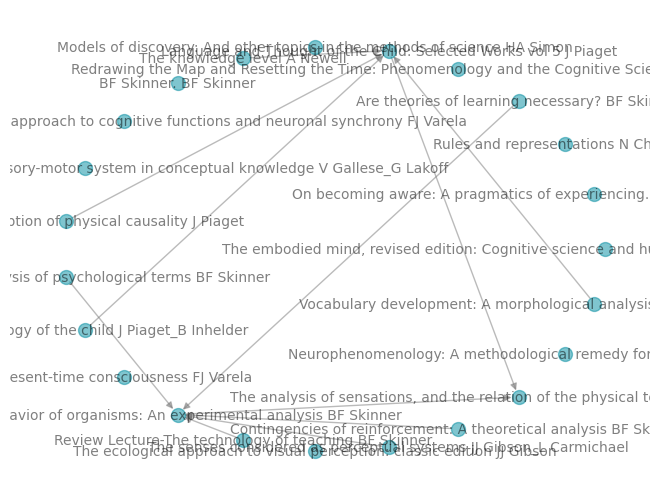

In [9]:
nx.draw_circular(sub_G, with_labels=True, labels={n:sub_G.nodes[n]['title'] + ' ' +  sub_G.nodes[n]['authors'] for n in sub_G.nodes}, node_size=100,  node_color='#008CA0', edge_color='#777777', alpha=0.5, font_size=10)

In [20]:
# make index for nodes
for i, n in enumerate(sub_G.nodes):
    sub_G.nodes[n]['id'] = i

In [10]:
# change nodes ids to integers
sub_G = nx.convert_node_labels_to_integers(sub_G)

In [11]:
print(len(sub_G.nodes))

23


In [13]:
from bokeh.models import Range1d, Plot
from bokeh.plotting import from_networkx

from bokeh.io import show, output_notebook, output_file
from bokeh.plotting import figure

from bokeh.models import HoverTool
from bokeh.palettes import Category20_20

from bokeh.models.graphs import NodesAndLinkedEdges
from bokeh.models import Circle, HoverTool, MultiLine, BoxZoomTool, ResetTool, WheelZoomTool, PanTool, TapTool, SaveTool, LabelSet, Label, PointDrawTool, ColumnDataSource

output_notebook()

# We could use figure here but don't want all the axes and titles
plot = figure(width=800, height=800,)

# Create a Bokeh graph from the NetworkX input using nx.spring_layout
graph = from_networkx(sub_G, nx.spring_layout, scale=1.8, center=(0,0))
# Blue circles for nodes, and light grey lines for edges
graph.node_renderer.glyph = Circle(size=5, fill_color='#2b83ba')
graph.edge_renderer.glyph = MultiLine(line_color="#cccccc", line_alpha=0.8, line_width=2)

# green hover for both nodes and edges
graph.node_renderer.hover_glyph = Circle(size=25, fill_color='#abdda4')
graph.edge_renderer.hover_glyph = MultiLine(line_color='#abdda4', line_width=4)

TOOLTIPS = [
    ("authors", "$authors"),
    ("title", "$title"),
    ("cited_by", "@cited_by"),
    ("cited_by_url", "@cited_by_url"),
    # ("id", "@id"),
]

plot.add_tools(HoverTool(tooltips=TOOLTIPS))
plot.add_tools(BoxZoomTool(), ResetTool(), WheelZoomTool(), PanTool(), TapTool(), SaveTool())


# When we hover over nodes, highlight adjecent edges too
graph.inspection_policy = NodesAndLinkedEdges()

x, y = zip(*graph.layout_provider.graph_layout.values())
node_labels = nx.get_node_attributes(sub_G, 'title')
node_authors = nx.get_node_attributes(sub_G, 'authors')
source = ColumnDataSource({'x': x, 'y': y,
                           'title': [node_labels[i] + " " + node_authors[i] for i in range(len(x))]})
labels = LabelSet(x='x', y='y', text='title', source=source,
                  background_fill_color='white', level='glyph', text_font_size='6pt')
pointdraw = PointDrawTool(renderers = [graph.node_renderer], empty_value = 'black')
plot.add_tools(pointdraw)
plot.renderers.append(labels)

plot.toolbar.active_tap = pointdraw
plot.toolbar.active_drag = pointdraw
plot.toolbar.active_scroll = WheelZoomTool()

plot.renderers.append(graph)
output_file("interactive_graphs.html")




show(plot)

Loading BokehJS ...

In [12]:
nx.__version__

'2.8.8'

In [32]:
# biggest component
G = nx.Graph(sub_G)
Gc = list(max(nx.connected_components(G), key=len))

In [33]:
Gc = G.subgraph(Gc)

In [34]:
# set labels for nodes as title and authors

for i in Gc.nodes:
    Gc.nodes[i]['label'] = Gc.nodes[i]['title'] + ' ' + Gc.nodes[i]['authors']

In [35]:
from pyvis import network as net



G = net.Network(height="750px", width="100%", bgcolor="white", font_color="black", select_menu=True, notebook=False, directed=True, filter_menu=True)
G.from_nx(Gc)



for node in G.nodes:
    # add all properties as node attributes
    node['title'] = ""
    for key, value in node.items():
        try:
            node["title"] += str(key) + " : " + str(value) + "\n"
        except:
            for k, v in value.items():
                node["title"] += str(k) + ":" + str(v) + "\n"
                
                
G.show_buttons(filter_=['nodes', 'physics'])
G.show("test.html")

PermissionError: [WinError 5] Access is denied: './lib\\bindings'

In [43]:
# import bookcut.bookcut as bc

## Pdf to txt analysis, identifying pages where is Mach mentioned

In [9]:
# load all downloaded pdf papers into a list
import PyPDF2 as pdf
import re

pdfs = {}

# find all .pdf files in downloaded_papers\ directory
import os
for file in os.listdir("downloaded_papers/"):
    if file.endswith(".pdf"):
        
        
        print(file)
        # creating an object 
        file = open(os.path.join("downloaded_papers/", file), 'rb')

        # creating a pdf reader object
        object = pdf.PdfFileReader(file)       

        # get number of pages
        NumPages = object.getNumPages()

        # define keyterms
        String = "Mach"

        # extract text and do the search
        for i in range(0, NumPages):
            PageObj = object.getPage(i)
            Text = PageObj.extractText() 
            # print(Text)
            ResSearch = re.search(String, Text)
            if ResSearch:
                # print(ResSearch)
                try:
                    pdfs[file].append(i)
                except:
                    pdfs[file] = [i]
                
        

Xref table not zero-indexed. ID numbers for objects will be corrected.


Are theories of learning necessary BF Skinner.pdf
BF Skinner BF Skinner.pdf


KeyboardInterrupt: 

In [2]:
print(pdfs)

{<_io.BufferedReader name='downloaded_papers/BF Skinner BF Skinner.pdf'>: [144, 151, 209, 459, 460], <_io.BufferedReader name='downloaded_papers/Contingencies of reinforcement A theoretical analysis BF Skinner.pdf'>: [99, 161, 261, 262, 265, 266, 267, 268, 269, 278, 284, 299], <_io.BufferedReader name='downloaded_papers/Language and Thought of the Child Selected Works vol V J Piaget.pdf'>: [92, 139, 187], <_io.BufferedReader name='downloaded_papers/Models of discovery And other topics in the methods of science HA Simon.pdf'>: [5, 99, 105, 147, 186, 252, 253, 291, 292, 310, 350, 354, 355, 356, 357, 358, 366, 367, 369, 373, 374, 378, 379, 406, 447, 454, 456, 463], <_io.BufferedReader name='downloaded_papers/Neurophenomenology A methodological remedy for the hard problem FJ Varela.pdf'>: [3], <_io.BufferedReader name='downloaded_papers/On becoming aware A pragmatics of experiencing. NE Depraz_FJ Varela_PE Vermersch.pdf'>: [169, 256, 280], <_io.BufferedReader name='downloaded_papers/Presen

In [4]:
# save pdfs to csv
import csv

# save list of dictionaries to csv using pandas
import pandas as pd

df = pd.DataFrame.from_dict(pdfs, orient='index')
df.to_csv('data\pdfs_positions_Mach_in_pdfs.csv')



## comparison of mach 'The analysis of sensations' to other papers / books in citation network.


In [1]:
# utility function for tokenization
def tokenize(sentences, stop_word = ''): # use stop words from wordcloud package
        tokenized = sentences.tokenize("\\W+")
        tokenized_lower = tokenized.tolower()
        tokenized_filtered = tokenized_lower[(tokenized_lower.nchar() >= 2) | (tokenized_lower.isna()),:]
        tokenized_words = tokenized_filtered[tokenized_filtered.grep("[0-9]",invert=True,output_logical=True),:]
        tokenized_words = tokenized_words[(tokenized_words.isna()) | (~ tokenized_words.isin(stop_word)),:]
        return tokenized_words


In [2]:
# NLP
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator, get_single_color_func
import PyPDF2 as pdf
import re
import nltk
from nltk.stem.porter import PorterStemmer

from sklearn.feature_extraction.text import CountVectorizer
import string
from nltk.corpus import stopwords
from gensim.models import Word2Vec
from nltk.stem import WordNetLemmatizer
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
import umap


import pypdfium2 as pdfium

# H2O
import h2o
from h2o.estimators import H2OWord2vecEstimator
from h2o.estimators import H2OGradientBoostingEstimator

c:\Users\jpast\My Drive (jpastorek5@gmail.com)\local_repositories\mach_influence\.venv\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
from nltk import FreqDist
import re
import pickle

In [4]:
import spacy.cli
spacy.cli.download("en_core_web_lg")
import en_core_web_lg
nlp = en_core_web_lg.load()

✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')


In [5]:
def make_word_cloud(words, stopwords=stopwords.words('english')):
    cloud = WordCloud(width=2000, 
                            height=1100, 
                            max_words=30, 
                            stopwords=stopwords, background_color='white',
                            color_func=lambda *args, **kwargs: "black").generate(' '.join(words))  # 
    return cloud

In [6]:
def baseline_clean(to_correct, capitals=True, bracketed_fn=False, odd_words_dict={}):
  # remove utf8 encoding characters and some punctuations
  result = re.sub(r'[\x00-\x08\x0b\x0c\x0e-\x1f\x7f-\xff\xad\x0c6§\\\£\Â*_<>""⎫•{}Γ~]', ' ', to_correct)
  result = re.sub(r'[\u2014\u2013\u2012-]', ' ', result)

  # replace whitespace characters with actual whitespace
  result = re.sub(r'\s', ' ', result)

  # replace odd quotation marks with a standard
  result = re.sub(r'[‘’“”]', "'", result)

  # replace the ﬀ, ﬃ and ﬁ with the appropriate counterparts
  result = re.sub(r'ﬀ', 'ff', result)
  result = re.sub(r'ﬁ', 'fi', result)
  result = re.sub(r'ﬃ', 'ffi', result)

  # remove or standardize some recurring common and meaninless words/phrases
  result = re.sub(r'\s*This\s*page\s*intentionally\s*left\s*blank\s*', ' ', result)
  result = re.sub(r'(?i)Aufgabe\s+', ' ', result)
  result = re.sub(r',*\s+cf\.', ' ', result)

  # some texts have footnotes conveniently in brackets - this removes them all, 
  # with a safety measure for unpaired brackets, and deletes all brackets afterwards
  if bracketed_fn:
    result = re.sub(r'\[.{0,300}\]|{.{0,300}}|{.{0,300}\]|\[.{0,300}}', ' ', result)
  result = re.sub(r'[\[\]{}]', ' ', result)

  # unify some abbreviations
  result = re.sub(r'&', 'and', result)
  result = re.sub(r'\se\.g\.\s', ' eg ', result)
  result = re.sub(r'\si\.e\.\s', ' ie ', result)
  result = re.sub('coroll\.', 'coroll', result)
  result = re.sub('pt\.', 'pt', result)

  # remove roman numerals, first capitalized ones
  result = re.sub(r'\s((I{2,}V*X*\.*)|(IV\.*)|(IX\.*)|(V\.*)|(V+I*\.*)|(X+L*V*I*]\.*))\s', ' ', result)
  # then lowercase
  result = re.sub(r'\s((i{2,}v*x*\.*)|(iv\.*)|(ix\.*)|(v\.*)|(v+i*\.*)|(x+l*v*i*\.*))\s', ' ', result)

  # remove periods and commas flanked by numbers
  result = re.sub(r'\d\.\d', ' ', result)
  result = re.sub(r'\d,\d', ' ', result)

  # remove the number-letter-number pattern used for many citations
  result = re.sub(r'\d*\w{,2}\d', ' ', result)

  # remove numerical characters
  result = re.sub(r'\d+', ' ', result)

  # remove words of 2+ characters that are entirely capitalized 
  # (these are almost always titles, headings, or speakers in a dialogue)
  # remove capital I's that follow capital words - these almost always roman numerals
  # some texts do use these capitalizations meaningfully, so we make this optional
  if capitals:
    result = re.sub(r'[A-Z]{2,}\s+I', ' ', result)
    result = re.sub(r'[A-Z]{2,}', ' ', result)

  # remove isolated colons and semicolons that result from removal of titles
  result = re.sub(r'\s+:\s*', ' ', result)
  result = re.sub(r'\s+;\s*', ' ', result)

  # remove isolated letters (do it several times because strings of isolated letters do not get captured properly)
  result = re.sub(r'\s[^aAI\.]\s', ' ', result)
  result = re.sub(r'\s[^aAI\.]\s', ' ', result)
  result = re.sub(r'\s[^aAI\.]\s', ' ', result)
  result = re.sub(r'\s[^aAI\.]\s', ' ', result)
  result = re.sub(r'\s[^aAI\.]\s', ' ', result)
  result = re.sub(r'\s[^aAI\.]\s', ' ', result)

  # remove isolated letters at the end of sentences or before commas
  result = re.sub(r'\s[^aI]\.', '.', result)
  result = re.sub(r'\s[^aI],', ',', result)

  # deal with spaces around periods and commas
  result = re.sub(r'\s+,\s+', ', ', result)
  result = re.sub(r'\s+\.\s+', '. ', result)

  # remove empty parantheses
  result = re.sub(r'(\(\s*\.*\s*\))|(\(\s*,*\s*)\)', ' ', result)

  # reduce multiple periods, commas, or whitespaces into a single one
  result = re.sub(r'\.+', '.', result)
  result = re.sub(r',+', ',', result)
  result = re.sub(r'\s+', ' ', result)

  # deal with isolated problem cases discovered in the data:
  for key in odd_words_dict.keys():
    result = re.sub(r''+key+'', odd_words_dict[key], result)

  return result

In [7]:
#@title Oddities Dictionary for Cleaning
# a dictionary of oddities to clean up
odd_words_dict = {'\sderstanding': 'derstanding',
                  '\sforthe\s': ' for the ',
                  '\sject': 'ject',
                  '\sjects': 'jects', 
                  '\sness': 'ness',
                  '\sper\scent\s': ' percent ',
                  '\sper\scent\.': ' percent.',
                  '\sper\scent,': ' percent,',
                  '\wi\son': 'ion',
                  '\spri\sori': ' priori',
                  '\stences\s': 'tences ',
                  '\sprincipleb': ' principle',
                  '\ssciousness': 'sciousness',
                  '\stion': 'tion',
                  '\spri\s': ' pri',
                  '\scluding': 'cluding',
                  '\sdom': 'dom',
                  '\sers': 'ers',
                  '\scritiq\s': ' critique ',
                  '\ssensati\s': ' sensation ',
                  '(?i)\syou\sll': " you'll",
                  '\sI\sll': " I'll",
                  '(?i)\swe\sll': " we'll",
                  '(?i)he\sll': " he'll",
                  '(?i)who\sll': "who'll",
                  '(?i)\sthere\sll\s': " there'll ",
                  '\seduca\s': ' education ',
                  '\slity\s': 'lity ',
                  '\smultaneously\s': 'multaneously ',
                  '\stically\s': 'tically ',
                  '\sDa\ssein\s': ' Dasein ',
                  '(?i)\sthey\sll\s': " they'll ",
                  '(?i)\sin\tum\s': ' in turn ',
                  '\scon~\s': ' con',
                  '\sà\s': ' a ',
                  '\sjor\s': ' for ',
                  '\sluminating\s': 'luminating ',
                  '\sselj\s': ' self ',
                  '\stial\s': 'tial ',
                  '\sversal\s': 'versal ',
                  '\sexis\st': ' exist',
                  '\splauded\s': 'plauded ',
                  '\suiry\s': 'uiry ',
                  '\svithin\s': ' within ',
                  '\soj\s': ' of ',
                  '\sposi\st': ' posit',
                  '\sra\sther\s': ' rather ',
                  '(?i)\sthat\sll\s': " that'll ",
                  '(?i)\sa\sll\s': ' all ',
                  '\so\sther\s': ' other ',
                  '\sra\sther\s': ' rather ',
                  '\snei\sther\s': ' neither ',
                  '\sei\sther\s': ' either ',
                  '\sfur\sther\s': ' further ',
                  '\sano\sther': ' another ',
                  '\sneces\s': ' neces',
                  'u\slar\s': 'ular ',
                  '\sference\s': 'ference ',
                  '(?i)it\sll\s': "it'll ",
                  '\stoge\sther': ' together ',
                  '\sknowledgeb\s': ' knowledge ',
                  'r\stain\s': 'rtain ',
                  'on\stain\s': 'ontain',
                  '(?i)j\sect\s': 'ject',
                  '\sob\sect\s': ' object ',
                  '\sbtle\s': 'btle ',
                  '\snition\s': 'nition ',
                  '\sdering\s': 'dering ', 
                  '\sized\s': 'ized ',
                  '\sther\shand': ' other hand',
                  '\ture\s': 'ture ',
                  '\sabso\sl': ' absol',
                  '\stly\s': 'tly ',
                  '\serty\s': 'erty ',
                  '\sobj\se': ' obj',
                  '\sffiir\s': ' for ',
                  '\sndeed\s': ' indeed ',
                  '\sfonn\s': ' form ',
                  '\snally\s': 'nally ',
                  'ain\sty\s': 'ainty ',
                  'ici\sty\s': 'icity ',
                  '\scog\sni': ' cogni',
                  '\sacc\s': ' acc',
                  '\sindi\svid\sual': ' individual', 
                  '\sintu\sit': ' intuit',
                  'r\sance\s': 'rance ',
                  '\ssions\s': 'sions ',
                  '\sances\s': 'ances ',
                  '\sper\sception\s': ' perception ',
                  '\sse\sries\s': ' series ',
                  '\sque\sries\s': ' queries ',
                  '\sessary\s': 'essary ',
                  '\sofa\s': ' of a ',
                  '\scer\stainty\s': ' certainty ',
                  'ec\stivity\s': 'ectivity ',
                  '\stivity\s': 'tivity ',
                  '\slation\s': 'lation ',
                  '\sir\sr': ' irr',
                  '\ssub\sstance\s': ' substance ',
                  'sec\sond\s': 'second ',
                  '\s\.rv': '',
                  '\story\s': 'tory ',
                  '\sture\s': 'ture ',
                  '\sminate\s': 'minate ',
                  '\sing\s': 'ing ',
                  '\splicity\s': 'plicity ',
                  '\ssimi\slar\s': ' similar ',
                  '\scom\smunity\s': ' community ',
                  '\sitselfa\s': ' itself a ',
                  '\ssimp\s': ' simply ',
                  '\scon\stex': ' contex',
                  '\scon\sseq': ' conseq',
                  '\scon\stai': ' contai',
                  '\sofwhat\s': ' of what ',
                  '\sui\s': 'ui',
                  '\sofan\s': ' of an ',
                  '\saccor\sdance\s': ' accordance ',
                  '\stranscen\sdental\s': ' transcendental ',
                  '\sap\spearances\s': ' appearances ',
                  'e\squences\s': 'equences ',
                  '\sorits\s': ' or its ',
                  '\simma\sn': ' imman',
                  '\seq\sua': ' equa',
                  '\simpl\sied\s': ' implied ',
                  '\sbuta\s': ' but a ',
                  '\sa\snd\s': ' and ',
                  '\sence\s': 'ence ',
                  '\stain\s': 'tain ',
                  '\sunder\sstanding\s': ' understanding ',
                  'i\sence\s': 'ience ',
                  'r\sence\s': 'rence ',
                  '\stical\s': 'tical ',
                  '\sobjectsb\s': ' objects ',
                  '\stbe\s': ' the ',
                  '\smul\st': ' mult',
                  '\sgen\seral\s': ' general ',
                  '\suniver\ssal\s': ' universal ',
                  '\scon\stent\s': ' content ',
                  '\spar\sticular\s': ' particular ',
                  'ver\ssity\s': 'versity ',
                  '\sCritiq\s': ' Critique ',
                  '\sphilo\ssophy\s': ' philosophy ',
                  '\seq\s': ' eq',
                  'inform\sation': 'information',
                  'fi\seld': 'field',
                  'obser\svation': 'observation',
                  'invari\sant': 'invariant',
                  'perspect\sive': 'perspective',
                  'differ\sen': 'differen',
                  }

In [8]:
nlp.max_length = 9000000

Are theories of learning necessary BF Skinner.pdf


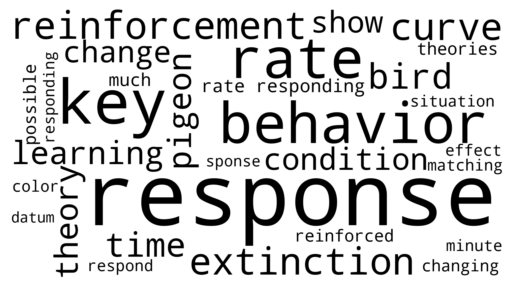

BF Skinner BF Skinner.pdf


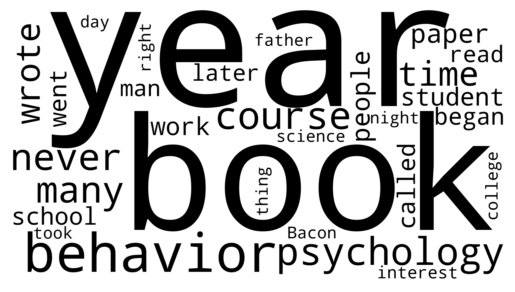

Contingencies of reinforcement A theoretical analysis BF Skinner.pdf


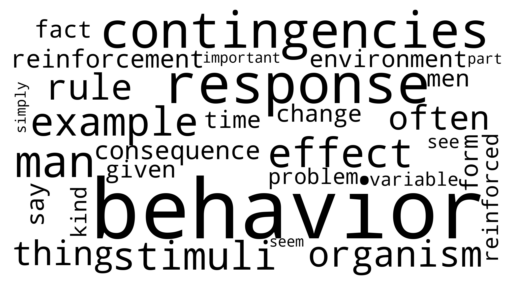

Language and Thought of the Child Selected Works vol V J Piaget.pdf


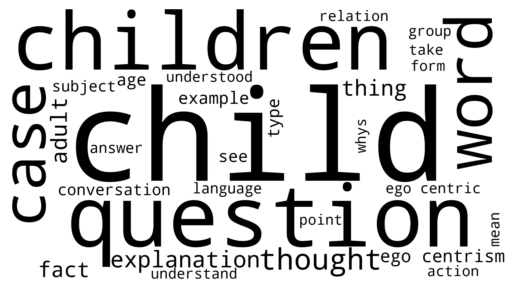

Models of discovery And other topics in the methods of science HA Simon.pdf


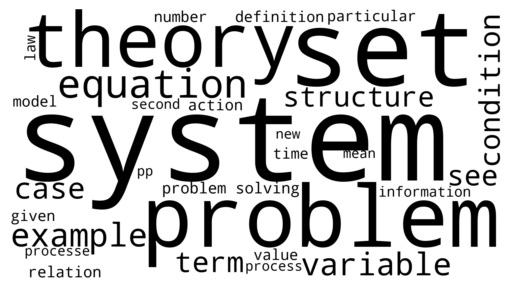

Neurophenomenology A methodological remedy for the hard problem FJ Varela.pdf


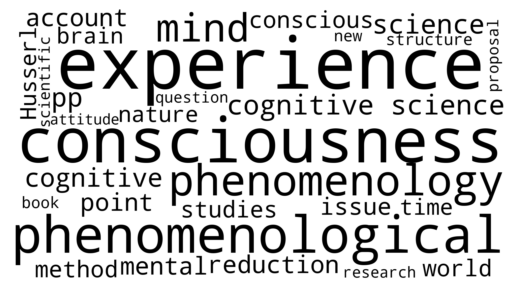

On becoming aware A pragmatics of experiencing. NE Depraz_FJ Varela_PE Vermersch.pdf


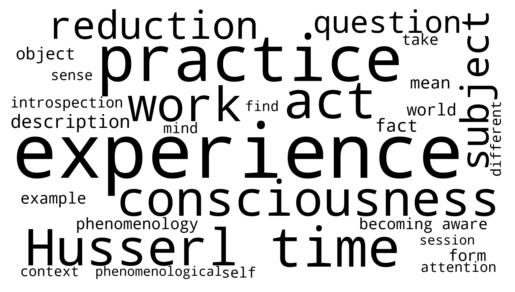

Redrawing the Map and Resetting the Time Phenomenology and the Cognitive Sciences S Gallagher_FJ Varela.pdf


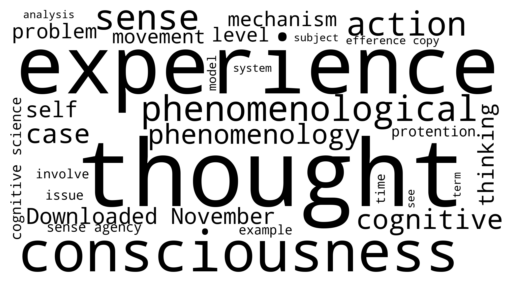

Resonant cell assemblies a new approach to cognitive functions and neuronal synchrony FJ Varela.pdf


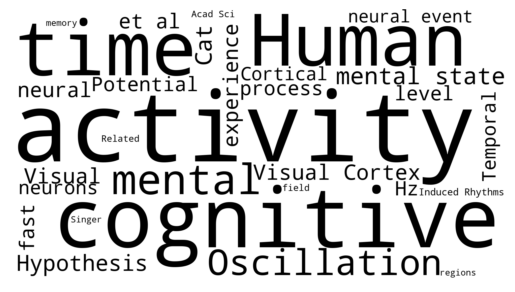

Review Lecture The technology of teaching BF Skinner.pdf


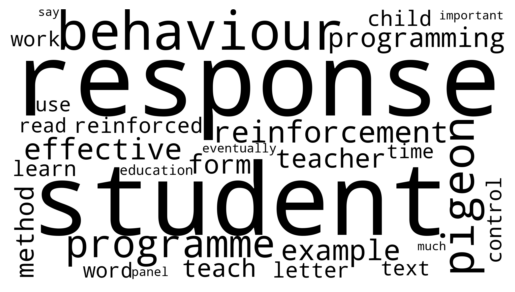

Rules and representations N Chomsky.pdf


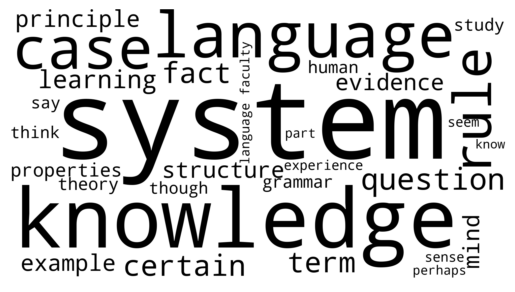

The Analysis of Sensations E Mach.txt


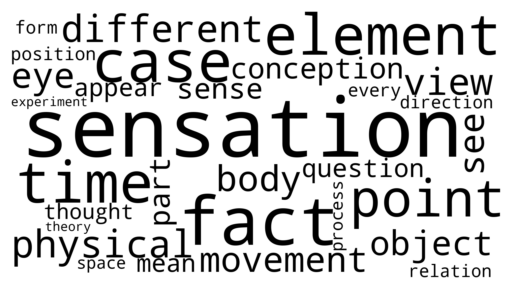

The behavior of organisms An experimental analysis BF Skinner.pdf


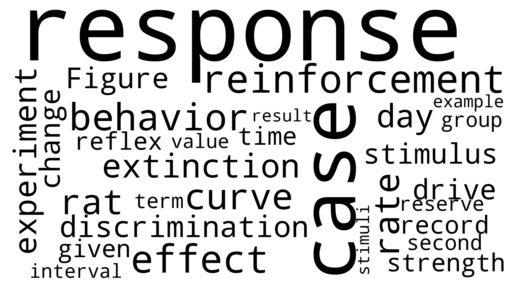

The brains concepts The role of the sensory motor system in conceptual knowledge V Gallese_G Lakoff.pdf


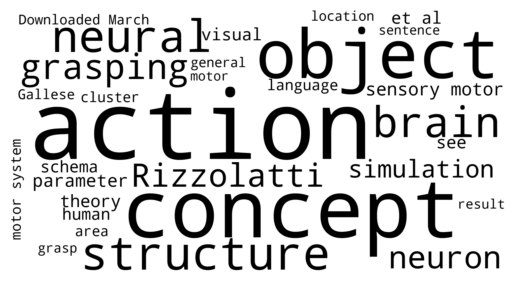

The childs conception of physical causality J Piaget.pdf


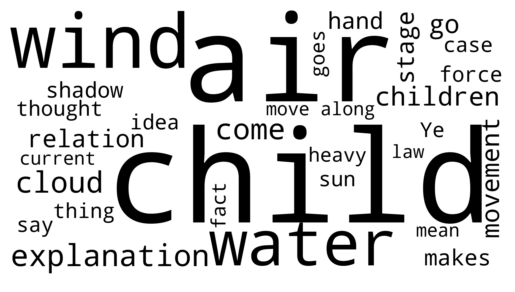

The ecological approach to visual perception JJ Gibson.pdf


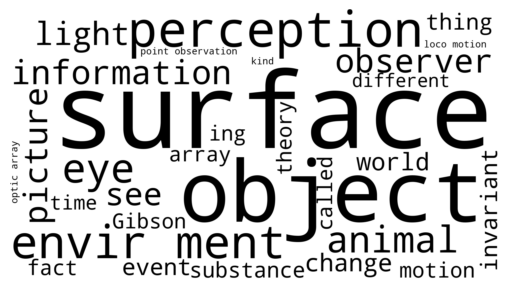

The embodied mind revised edition Cognitive science and human experience FJ Varela_E Thompson_E Rosch.pdf


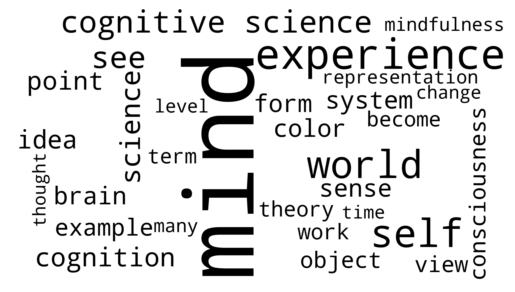

The knowledge level A Newell.pdf


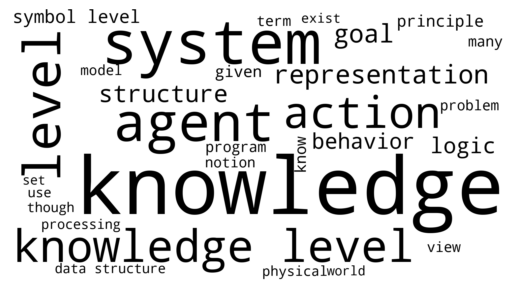

The operational analysis of psychological terms BF Skinner.pdf


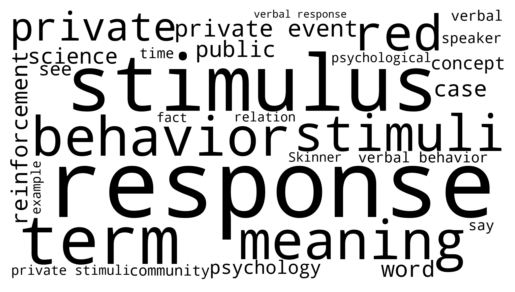

The psychology of the child J Piaget_B Inhelder.pdf


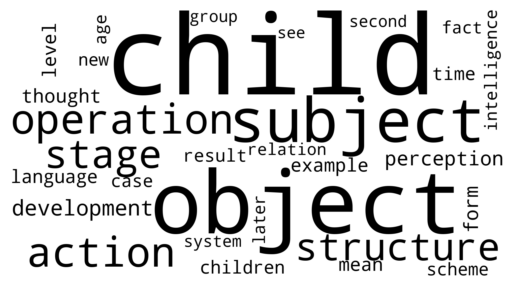

The senses considered as perceptual systems JJ Gibson_L Carmichael.pdf


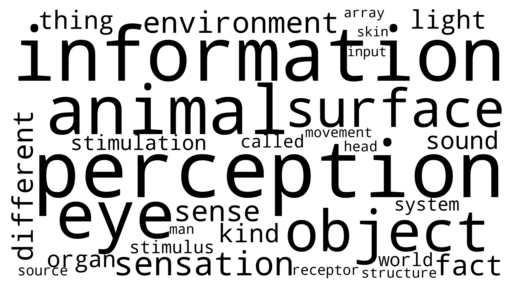

Vocabulary development A morphological analysis JM Anglin_GA Miller_PC Wakefield.pdf


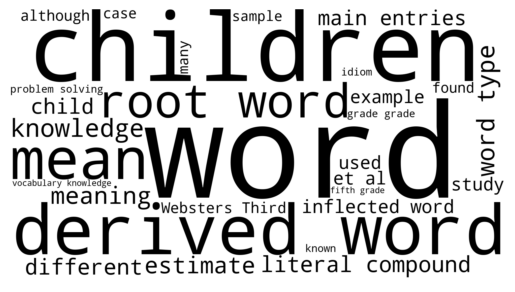

In [9]:
stop_words = set(stopwords.words('english')).union(set(STOPWORDS)).union(set(string.punctuation)).union(set(['“','”','...',"''",'’','``', "'", "‘"]))

custom_stopwords = set(['–', 'also', 'something', 'cf', 'thus', 'two', 'now', 'would', 'make', 'eb', 'u', 'well', 'even', 'said', 'eg', 'us',
                    'n', 'e', 'da', 'therefore', 'however', 'would', 'must', 'merely', 'way', 'since', 'latter', 'first',
                    'B', 'upon', 'yet', 'cannot', 'c', 'C', 'let', 'may', 'might', "'s", 'b', 'ofthe', 'p.', '_', '-', 'eg', 'e.g.',
                    'ie', 'i.e.', 'f', 'l', "n't", 'e.g', 'i.e', '—', '--', 'hyl', 'phil', 'one', 'press', 'cent', 'place', 'two',
                    'else', 'shall', 'either', 'still', 'rather', 'another', 'made', 'without', 'fig', 'etc', 'lev',  'phr',
                    'et al', '' 
                    ])
stop_words = stop_words.union(custom_stopwords)
        
pdfs = {}


   
# find all .pdf files in downloaded_papers\ directory
import os
for file_name in os.listdir("downloaded_papers/"):
    if file_name.endswith(".pdf") or file_name.endswith(".txt"):
        
    
        print(file_name)
        
        path = os.path.join("downloaded_papers/", file_name)
        # creating an object 
        # file = open(path, 'rb', encoding='utf-8')
        
        whole_text = ''
        if file_name.endswith(".pdf"):

        # # creating a pdf reader object
        # object = pdf.PdfFileReader(file)   
        
    
            pdf = pdfium.PdfDocument(path)
            
            if "Present time consciousness FJ Varela" in file_name: # is missing
                start_page = 217
                end_page = 271
            elif "BF Skinner BF Skinner" in file_name:
                start_page = 401
                end_page = 426
            elif "Rules and representations N Chomsky" in file_name:
                start_page = 0
                end_page = 15
            else:
                start_page = 1
                # end_page = object.getNumPages()
                end_page = len(pdf)
                if end_page > 70: # if paper is long it is book
                    start_page = 10 # skip first 10 pages, we have enough text for analysis
            
            # extract text and do the search
            for i in range(start_page, end_page):
                # PageObj = object.getPage(i)
                # Text = PageObj.extractText() 
                page = pdf[i] 
                width, height = page.get_size()
                textpage = page.get_textpage()
                Text = textpage.get_text_bounded(bottom=100, top=height-100)
                # print(text_part)
                whole_text += Text
        
        elif file_name.endswith(".txt"):
            file = open(path, 'r', encoding='utf-8')
            whole_text = ' '.join(file.read().splitlines())


        whole_text = baseline_clean(whole_text, capitals=True,
                        bracketed_fn=True,
                        odd_words_dict=odd_words_dict)

        # whole_text = whole_text.lower()
        
        
        text_nlp = nlp(whole_text, disable=['ner'])

        # words cleaning ----
        
        # break the text into words
        words = whole_text.split(' ')

        # remove punctuation from each word
        table = str.maketrans('', '', string.punctuation)
        stripped = [w.translate(table) for w in words]

        # remove remaining tokens that are not alphabetic
        words = [word for word in stripped if word.isalpha()]

        # filter out stopwords
        words = [w for w in words if not w in stop_words]

        # filter out short tokens
        words = [word for word in words if len(word) > 1]

        # stemming of words
        porter = PorterStemmer()
        stemmed = [porter.stem(word) for word in words]

        # lemmatization of words
        lemmatizer = WordNetLemmatizer()
        lemmatized = [lemmatizer.lemmatize(word) for word in words]
        
        pdfs[file_name] = {'sentences': list(text_nlp.sents), 'words': words, 'stemmed': stemmed, 'lemmatized': lemmatized}
        
        # bag of words
        # vectorizer = CountVectorizer()
        # X = vectorizer.fit_transform(sentences)
        # # print(vectorizer.get_feature_names())
        # print(X.toarray())
        
        # pdfs[file_name]['bag_of_words'] = X.toarray()

        # # # # tf-idf
        # # vectorizer = TfidfVectorizer()
        # # X = vectorizer.fit_transform(sentences)
        # # print(vectorizer.get_feature_names())
        # # print(X.toarray())

        # pdfs[file_name]['vectorizer'] = X.toarray()

        # # word embeddings
        # model = Word2Vec(sentences, min_count=1)

        # pdfs[file_name]['Word2Vec'] = model

        # # save model
        # model.save(f'models_for_papers\{file_name}.bin')
        
        # make wordcloud
        wordcloud = make_word_cloud(words, stop_words)
        
        # Display the generated image:
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()
    
        # save wordcloud
        wordcloud.to_file(f'models_for_papers\{file_name}.png')
        
        pdfs[file_name]['wordcloud'] = wordcloud
    

In [17]:
with open('data\pdfs_analysis.pickle', 'wb') as handle:
    
    
    pickle.dump(pdfs, handle)
    
    


AttributeError: Can't pickle local object 'make_word_cloud.<locals>.<lambda>'

(0.0, 1.0, 0.0, 1.0)

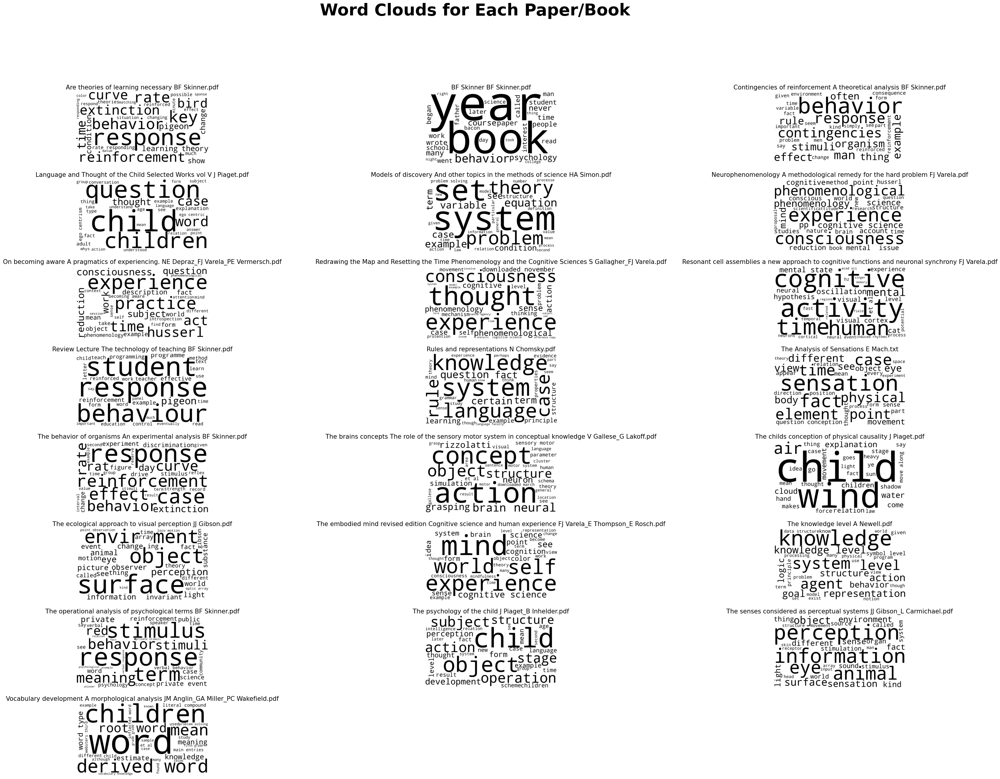

In [40]:
fig, ax = plt.subplots(8, 3, figsize=(43, 30))
fig.suptitle('Word Clouds for Each Paper/Book', size=40, fontweight='bold')

for i, file_name in enumerate(pdfs):
    ax[i//3, i%3].imshow(pdfs[file_name]['wordcloud'], interpolation='bilinear')
    ax[i//3, i%3].axis("off")
    ax[i//3, i%3].set_title(file_name, size=15)
    
ax[7, 1].axis("off")
ax[7, 2].axis("off")

In [41]:
freq_dist_dict = {}
for file_name in pdfs.keys():
    freq_dict = FreqDist(pdfs[file_name]['words'])
    freq_dist_dict[file_name] = freq_dict.most_common(15)

C:\Users\jpast\AppData\Local\Temp\ipykernel_22720\4137514224.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xlabels, rotation=35, size='large', ha='right')
C:\Users\jpast\AppData\Local\Temp\ipykernel_22720\4137514224.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xlabels, rotation=35, size='large', ha='right')
C:\Users\jpast\AppData\Local\Temp\ipykernel_22720\4137514224.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xlabels, rotation=35, size='large', ha='right')
C:\Users\jpast\AppData\Local\Temp\ipykernel_22720\4137514224.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xlabels, rotation=35, size='large', ha='right')
C:\Users\jpast\AppData\Local\Temp\ipykernel_22720\4137514224.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_

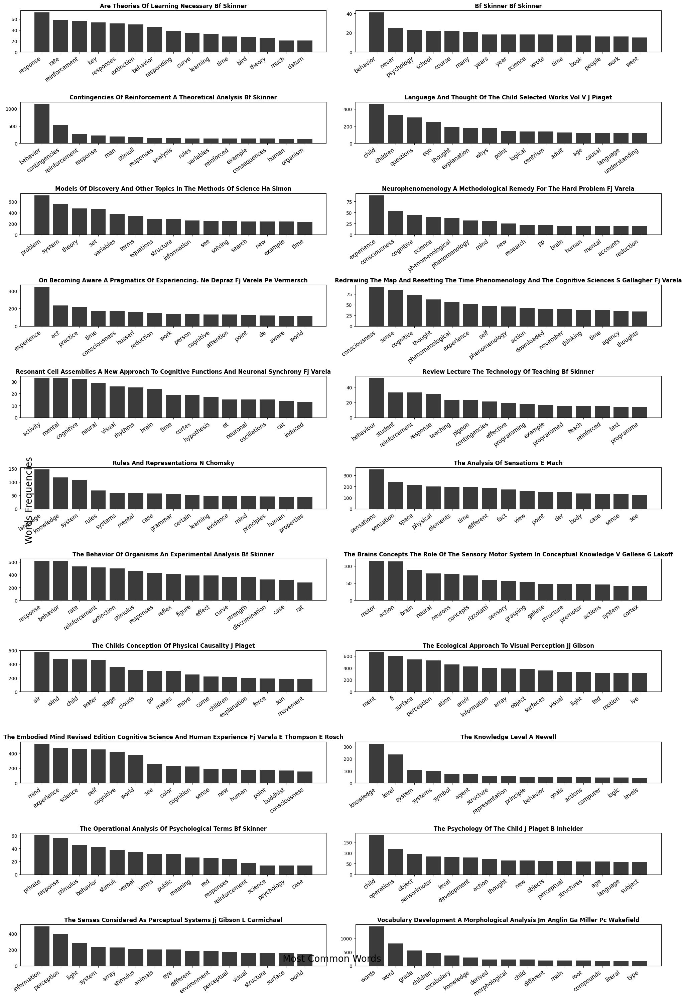

In [43]:
fig, axs = plt.subplots(nrows=11, ncols=2, figsize=(90, 30))
fig.set_size_inches(20, 30)
fig.subplots_adjust(wspace=1)
fig.subplots_adjust(hspace=0.8)
# 

for school, ax in zip(freq_dist_dict.keys(), axs.flatten()):
    ax.bar(x=[x[0] for x in freq_dist_dict[school]], height=[x[1] for x in freq_dist_dict[school]], color='#3B3B3B')
    xlabels = [x[0] for x in freq_dist_dict[school]]
    ax.set_xticklabels(xlabels, rotation=35, size='large', ha='right')
    # ax.set_yticklabels(ax.get_yticklabels(), size='x-large')    
    ax.set_title(school.replace('_', ' ').replace('.pdf','').replace('.txt','').title(), size='large', fontweight='bold')
# share x axis and y axis
fig.text(0.5, 0.04, 'Most Common Words', ha='center', size=20)
fig.text(0.04, 0.5, 'Words Frequencies', va='center', rotation='vertical', size=20)
fig.tight_layout()
plt.show()

In [10]:
import random

In [11]:
# print some sentences
for file_name in pdfs:
    print(file_name)
    
    for i in range(10):
        print(random.choice(pdfs[file_name]['sentences']))
    # print(pdfs[file_name]['sentences'][:10])

Are theories of learning necessary BF Skinner.pdf
con sider, for example, the case of latency.
we study this rate by designing a situation in which a response may be freely repeated, choosing a response (for ex ample, touching or pressing a small lever or key) that may be easily observed and counted.
precisely what responses are we to take into account in predicting a future in stance?
a preference remains fixed if reinforcement is withheld.
a statement about behavior may support such a theory but will never resemble it in terms or syntax.
when we observe a pigeon emitting responses at a constant rate without reinforcement, we are not likely to explain an extinction curve containing perhaps a few hundred responses by appeal to the piling up of reaction inhibition or any other fatigue product.
the bird was then fed in the dimly lighted experimental apparatus in the absence of the key for several days, during which emotional responses to the apparatus disappeared.
choosing the opposite i

In [3]:
import pickle
with open('data\pdfs_analysis.pickle', 'rb') as handle:
    pdfs = pickle.load(handle)

EOFError: Ran out of input

In [46]:
# find overlap between wordclouds
pdfs_comparison = {}

for file_name in pdfs.keys():
    most_common_words = [x[0] for x in FreqDist(pdfs[file_name]['words']).most_common(30)]
    pdfs_comparison[file_name] = most_common_words

In [49]:
comparison_wordclouds = dict()

# compare keys of wordclouds
for file_name1 in pdfs_comparison.keys():
    for file_name2 in pdfs_comparison.keys():
        if file_name1 != file_name2 and file_name1 == 'The Analysis of Sensations E Mach.txt':
            intersection = set(pdfs_comparison[file_name1]).intersection(set(pdfs_comparison[file_name2]))
            print(file_name2, len(intersection), intersection)
            comparison_wordclouds[file_name2] = [len(intersection), intersection]
            
# save wordclouds comparison with pandas
import pandas as pd
df = pd.DataFrame.from_dict(comparison_wordclouds, orient='index', columns=['# overlap (max 30)', 'overlapping words'])
df.to_csv('data\wordclouds_comparison.csv')
            

Are theories of learning necessary BF Skinner.pdf 3 {'theory', 'process', 'time'}
BF Skinner BF Skinner.pdf 2 {'time', 'many'}
Contingencies of reinforcement A theoretical analysis BF Skinner.pdf 2 {'given', 'time'}
Language and Thought of the Child Selected Works vol V J Piaget.pdf 6 {'fact', 'point', 'question', 'view', 'see', 'case'}
Models of discovery And other topics in the methods of science HA Simon.pdf 7 {'theory', 'processes', 'process', 'time', 'given', 'see', 'case'}
Neurophenomenology A methodological remedy for the hard problem FJ Varela.pdf 2 {'time', 'point'}
On becoming aware A pragmatics of experiencing. NE Depraz_FJ Varela_PE Vermersch.pdf 7 {'fact', 'sense', 'point', 'means', 'question', 'time', 'view'}
Redrawing the Map and Resetting the Time Phenomenology and the Cognitive Sciences S Gallagher_FJ Varela.pdf 4 {'theory', 'movement', 'time', 'sense'}
Resonant cell assemblies a new approach to cognitive functions and neuronal synchrony FJ Varela.pdf 2 {'process', 'ti

In [70]:
import pickle
with open('data\pdfs_analysis.pickle', 'rb') as handle:
    pdfs = pickle.load(handle)

EOFError: Ran out of input

In [10]:
import pandas as pd

In [11]:
# dataframe from dict
df = pd.DataFrame.from_dict(pdfs, orient='index')
# name fist column as 'file_name'
df.index.name = 'file_name'
df.to_csv('temp.csv')
df = pd.read_csv('temp.csv')

In [12]:
df.head()

,file_name,sentences,words,stemmed,lemmatized,wordcloud
0,Are theories of learning necessary BF Skinner.pdf,"[events., In a third type of learning theory t...","['events', 'In', 'third', 'type', 'learning', ...","['event', 'in', 'third', 'type', 'learn', 'the...","['event', 'In', 'third', 'type', 'learning', '...",<wordcloud.wordcloud.WordCloud object at 0x000...
1,BF Skinner BF Skinner.pdf,"[ppp, and artistic interests., When he died su...","['ppp', 'artistic', 'interests', 'When', 'died...","['ppp', 'artist', 'interest', 'when', 'die', '...","['ppp', 'artistic', 'interest', 'When', 'died'...",<wordcloud.wordcloud.WordCloud object at 0x000...
2,Contingencies of reinforcement A theoretical a...,"[wander aimlessly, getting successively closer...","['wander', 'aimlessly', 'getting', 'successive...","['wander', 'aimlessli', 'get', 'success', 'clo...","['wander', 'aimlessly', 'getting', 'successive...",<wordcloud.wordcloud.WordCloud object at 0x000...
3,Language and Thought of the Child Selected Wor...,"[place of snails, and in ordering and labellin...","['snails', 'ordering', 'labelling', 'much', 'c...","['snail', 'order', 'label', 'much', 'carepiage...","['snail', 'ordering', 'labelling', 'much', 'ca...",<wordcloud.wordcloud.WordCloud object at 0x000...
4,Models of discovery And other topics in the me...,"[ , is no new thing for a practicing scientist...","['new', 'thing', 'practicing', 'scientist', 's...","['new', 'thing', 'practic', 'scientist', 'sedu...","['new', 'thing', 'practicing', 'scientist', 's...",<wordcloud.wordcloud.WordCloud object at 0x000...


In [13]:
# expand sentences to separate rows with filename
sentences = []
for file in pdfs:
    for sentence in pdfs[file]['sentences']:
        
        sentences.append({'file_name': str(file), 'sentences': str(sentence), 'sentence_length': len(sentence)})


# create dataframe
df_sentences = pd.DataFrame(sentences)
df_sentences['sentences'] = df_sentences['sentences'].astype(str)
df_sentences['file_name'] = df_sentences['file_name'].astype(str)


In [14]:
# lower all sentences and remove punctuation



### Deal with short sentences 

In [15]:
num_of_short_entries = len(df_sentences[df_sentences['sentence_length'] < 20])
num_of_short_entries

29873

In [16]:
df_sentences[df_sentences['sentence_length'] < 20].sample(20)

,file_name,sentences,sentence_length
22563,Resonant cell assemblies a new approach to cog...,Lopes da Silva.,4
35676,The childs conception of physical causality J ...,Which is prior to the other It would be hard t...,13
35191,The childs conception of physical causality J ...,How Has the cold any force,6
28411,The behavior of organisms An experimental anal...,We have the refusal of all responses not answe...,17
20566,On becoming aware A pragmatics of experiencing...,Das Ethos der Reduktion als leibliche Einstell...,8
43991,The ecological approach to visual perception J...,All these assertions are extremely dubious.,7
62504,Vocabulary development A morphological analysi...,The measurement of individual differences in g...,10
39387,The ecological approach to visual perception J...,The following list mentions names in order to ...,13
6603,Language and Thought of the Child Selected Wor...,"Ah, here Eun? Eun ):",7
25758,The Analysis of Sensations E Mach.txt,But I had only to look to convince myself that...,17


In [17]:
df_sentences = df_sentences.drop(df_sentences[df_sentences['sentence_length'] < 20].index)
len(df_sentences)

32645

In [18]:
len(df_sentences)

32645

In [19]:


# start H2O
h2o.init()

given_types = {'file_name': 'string', 'sentences': 'string'}
# upload data to H2O environment
text_h2o = h2o.H2OFrame(df_sentences[['file_name', 'sentences']], column_types=given_types)


words = tokenize(text_h2o['sentences'])
print(text_h2o.types)

import random
# train Word2Vec model
random.seed(1234)

w2v_model = H2OWord2vecEstimator(vec_size = 50,
                                 window_size = 5,
                                 sent_sample_rate = 0.001,
                                 init_learning_rate = 0.025,
                                 epochs = 10)


w2v_model.train(training_frame = words)

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
; Java HotSpot(TM) 64-Bit Server VM (build 25.333-b02, mixed mode)
  Starting server from C:\Users\jpast\My Drive (jpastorek5@gmail.com)\local_repositories\mach_influence\.venv\Lib\site-packages\h2o\backend\bin\h2o.jar
  Ice root: C:\Users\jpast\AppData\Local\Temp\tmpp680f1vx
  JVM stdout: C:\Users\jpast\AppData\Local\Temp\tmpp680f1vx\h2o_jpast_started_from_python.out
  JVM stderr: C:\Users\jpast\AppData\Local\Temp\tmpp680f1vx\h2o_jpast_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,06 secs
H2O_cluster_timezone:,Europe/Prague
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.38.0.3
H2O_cluster_version_age:,16 days
H2O_cluster_name:,H2O_from_python_jpast_5t1p5l
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.495 Gb
H2O_cluster_total_cores:,8
H2O_cluster_allowed_cores:,8
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
{'file_name': 'string', 'sentences': 'string'}
word2vec Model Build progress: |█████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OWord2vecEstimator : Word2Vec
Model Key: Word2Vec_model_python_1670597107539_1

No summary for this model

[tips]
Use `model.explain()` to inspect the model.
--
Use `h2o.display.toggle_user_tips()` to switch on/off this section.

In [20]:
# create vector representation for each sentence (as average of the word vectors)
text_vec = w2v_model.transform(words, aggregate_method = 'AVERAGE')
# and add target 'file_name' to vectors
text_vec = text_vec.cbind(text_h2o['file_name'])

In [21]:
# vector features (columns w/o the label "file_name")
features = text_vec.columns

features.remove('file_name')

In [22]:
# convert H2O frame to Pandas data frame
df_text_vec = text_vec.as_data_frame()

# # drop rows with missing values
# df_text_vec = df_text_vec.dropna(axis=0)

In [23]:
df_text_vec.file_name.value_counts()

Models of discovery And other topics in the methods of science HA Simon.pdf                                    4292
The ecological approach to visual perception JJ Gibson.pdf                                                     3393
The behavior of organisms An experimental analysis BF Skinner.pdf                                              3106
The embodied mind revised edition Cognitive science and human experience FJ Varela_E Thompson_E Rosch.pdf      2704
The senses considered as perceptual systems JJ Gibson_L Carmichael.pdf                                         2689
The Analysis of Sensations E Mach.txt                                                                          2607
Contingencies of reinforcement A theoretical analysis BF Skinner.pdf                                           2384
On becoming aware A pragmatics of experiencing. NE Depraz_FJ Varela_PE Vermersch.pdf                           2261
Language and Thought of the Child Selected Works vol V J Piaget.pdf     

In [24]:
df_text_vec.file_name.unique()

array(['Are theories of learning necessary BF Skinner.pdf',
       'BF Skinner BF Skinner.pdf',
       'Contingencies of reinforcement A theoretical analysis BF Skinner.pdf',
       'Language and Thought of the Child Selected Works vol V J Piaget.pdf',
       'Models of discovery And other topics in the methods of science HA Simon.pdf',
       'Neurophenomenology A methodological remedy for the hard problem FJ Varela.pdf',
       'On becoming aware A pragmatics of experiencing. NE Depraz_FJ Varela_PE Vermersch.pdf',
       'Redrawing the Map and Resetting the Time Phenomenology and the Cognitive Sciences S Gallagher_FJ Varela.pdf',
       'Resonant cell assemblies a new approach to cognitive functions and neuronal synchrony FJ Varela.pdf',
       'Review Lecture The technology of teaching BF Skinner.pdf',
       'Rules and representations N Chomsky.pdf',
       'The Analysis of Sensations E Mach.txt',
       'The behavior of organisms An experimental analysis BF Skinner.pdf',
       'T

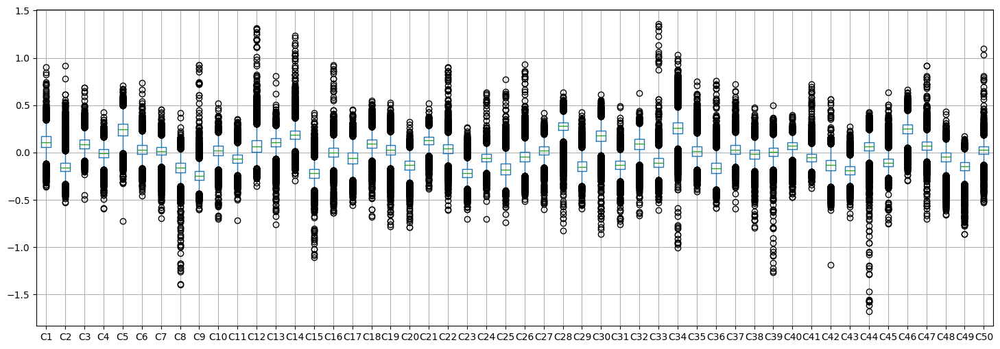

In [25]:
# let's first make a simple visualization: boxplot for each column
plt.figure(figsize=(18,6))
df_text_vec[features].boxplot()
plt.show()

In [26]:
import umap.umap_ as umap

In [27]:
# remove NaNs
df_text_vec = df_text_vec.dropna(axis=0)

In [28]:
# run UMAP algorithm to get a low dimensional (in our case 2D) representation
dim_reducer = umap.UMAP(random_state=111)

text_vec_umap = dim_reducer.fit_transform(df_text_vec[features])

In [29]:
# convert result matrix to data frame
df_text_vec_umap = pd.DataFrame(text_vec_umap, columns=['x','y'])

df_text_vec_umap['file_name'] = df_text_vec.file_name.tolist()

In [30]:
import seaborn as sns

In [31]:

# difference between sets
set(df_sentences['file_name'].unique()) - set(df_text_vec_umap.file_name.unique())


set()

In [32]:
# print how much sentences we have for each file_name
df_sentences.groupby('file_name').count().sort_values('sentences', ascending=False)

,sentences,sentence_length
file_name,,
Models of discovery And other topics in the methods of science HA Simon.pdf,4292,4292
The ecological approach to visual perception JJ Gibson.pdf,3393,3393
The behavior of organisms An experimental analysis BF Skinner.pdf,3106,3106
The embodied mind revised edition Cognitive science and human experience FJ Varela_E Thompson_E Rosch.pdf,2704,2704
The senses considered as perceptual systems JJ Gibson_L Carmichael.pdf,2689,2689
The Analysis of Sensations E Mach.txt,2607,2607
Contingencies of reinforcement A theoretical analysis BF Skinner.pdf,2384,2384
On becoming aware A pragmatics of experiencing. NE Depraz_FJ Varela_PE Vermersch.pdf,2261,2261
Language and Thought of the Child Selected Works vol V J Piaget.pdf,2069,2069


In [33]:
# print how much sentences we have for each file_name
df_text_vec_umap.groupby('file_name').count()

,x,y
file_name,,
Are theories of learning necessary BF Skinner.pdf,255,255
BF Skinner BF Skinner.pdf,268,268
Contingencies of reinforcement A theoretical analysis BF Skinner.pdf,2384,2384
Language and Thought of the Child Selected Works vol V J Piaget.pdf,2069,2069
Models of discovery And other topics in the methods of science HA Simon.pdf,4292,4292
Neurophenomenology A methodological remedy for the hard problem FJ Varela.pdf,281,281
On becoming aware A pragmatics of experiencing. NE Depraz_FJ Varela_PE Vermersch.pdf,2261,2261
Redrawing the Map and Resetting the Time Phenomenology and the Cognitive Sciences S Gallagher_FJ Varela.pdf,337,337
Resonant cell assemblies a new approach to cognitive functions and neuronal synchrony FJ Varela.pdf,94,94


In [34]:
import numpy as np

In [35]:

# take paper with name The Analysis of Sensations out of the data frame

df_text_vec_mach = df_text_vec_umap[df_text_vec_umap['file_name'] == 'The Analysis of Sensations E Mach.txt'].copy()

df_text_vec_umap = df_text_vec_umap[df_text_vec_umap['file_name'] != 'The Analysis of Sensations E Mach.txt']

# assign each 

#  divide df_text_vec_umap.file_name.unique() into n groups
n = 3
# split into n groups but keep one publication in each group
groups = np.array_split(df_text_vec_umap.file_name.unique(), n)

# dataframes according groups
df_group1 = df_text_vec_umap[df_text_vec_umap['file_name'].isin(groups[0])]
df_group2 = df_text_vec_umap[df_text_vec_umap['file_name'].isin(groups[1])]
df_group3 = df_text_vec_umap[df_text_vec_umap['file_name'].isin(groups[2])]

# put df_text_vec_mach into each of the groups
df_group1 = df_group1.append(df_text_vec_mach)
df_group2 = df_group2.append(df_text_vec_mach)
df_group3 = df_group3.append(df_text_vec_mach)


C:\Users\jpast\AppData\Local\Temp\ipykernel_224156\981618877.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_group1 = df_group1.append(df_text_vec_mach)
C:\Users\jpast\AppData\Local\Temp\ipykernel_224156\981618877.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_group2 = df_group2.append(df_text_vec_mach)
C:\Users\jpast\AppData\Local\Temp\ipykernel_224156\981618877.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_group3 = df_group3.append(df_text_vec_mach)


In [36]:
groups = [df_group1, df_group2, df_group3]

In [37]:
len(df_text_vec_mach)

2607

In [38]:
len(df_text_vec_umap)

30038

In [39]:
df_group2.file_name.unique()

array(['Redrawing the Map and Resetting the Time Phenomenology and the Cognitive Sciences S Gallagher_FJ Varela.pdf',
       'Resonant cell assemblies a new approach to cognitive functions and neuronal synchrony FJ Varela.pdf',
       'Review Lecture The technology of teaching BF Skinner.pdf',
       'Rules and representations N Chomsky.pdf',
       'The behavior of organisms An experimental analysis BF Skinner.pdf',
       'The brains concepts The role of the sensory motor system in conceptual knowledge V Gallese_G Lakoff.pdf',
       'The childs conception of physical causality J Piaget.pdf',
       'The Analysis of Sensations E Mach.txt'], dtype=object)

c:\Users\jpast\My Drive (jpastorek5@gmail.com)\local_repositories\mach_influence\.venv\lib\site-packages\seaborn\relational.py:657: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  args = np.asarray(x), np.asarray(y), np.asarray(s), np.asarray(c)
c:\Users\jpast\My Drive (jpastorek5@gmail.com)\local_repositories\mach_influence\.venv\lib\site-packages\seaborn\relational.py:657: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  args = np.asarray(x), np.asarray(y), np.asarray(s), np.asarray(c)
c:\Users\jpast\My Drive (jpastorek5@gmail.com)\local_repositories\ma

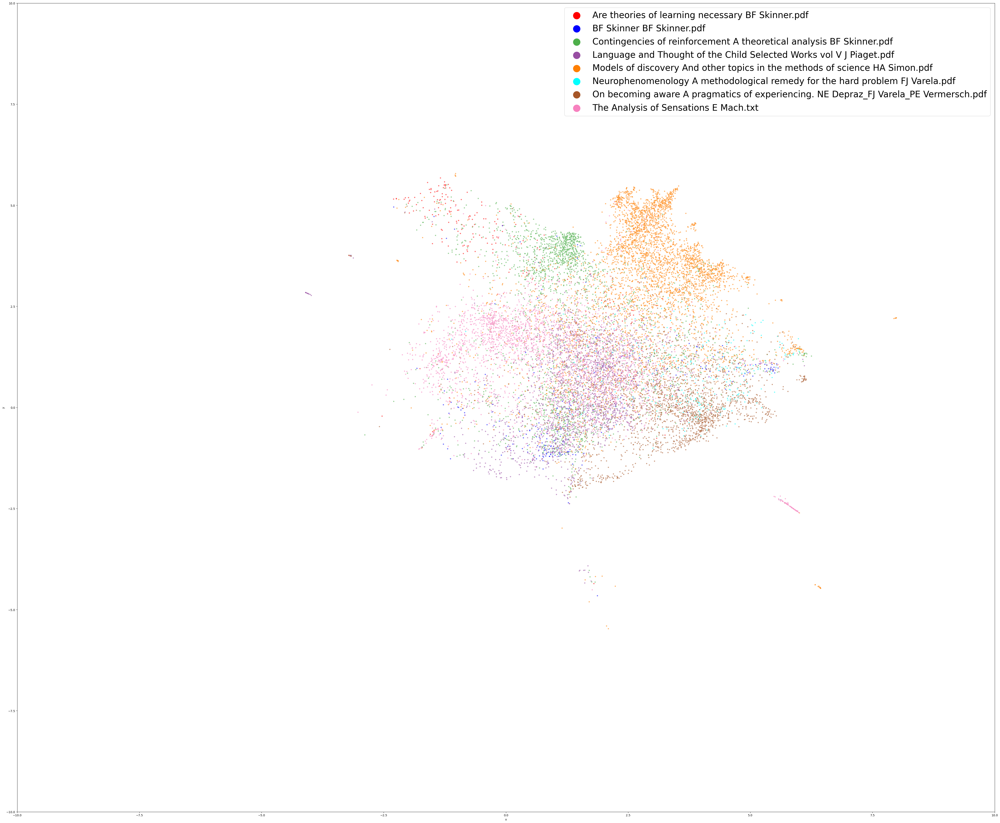

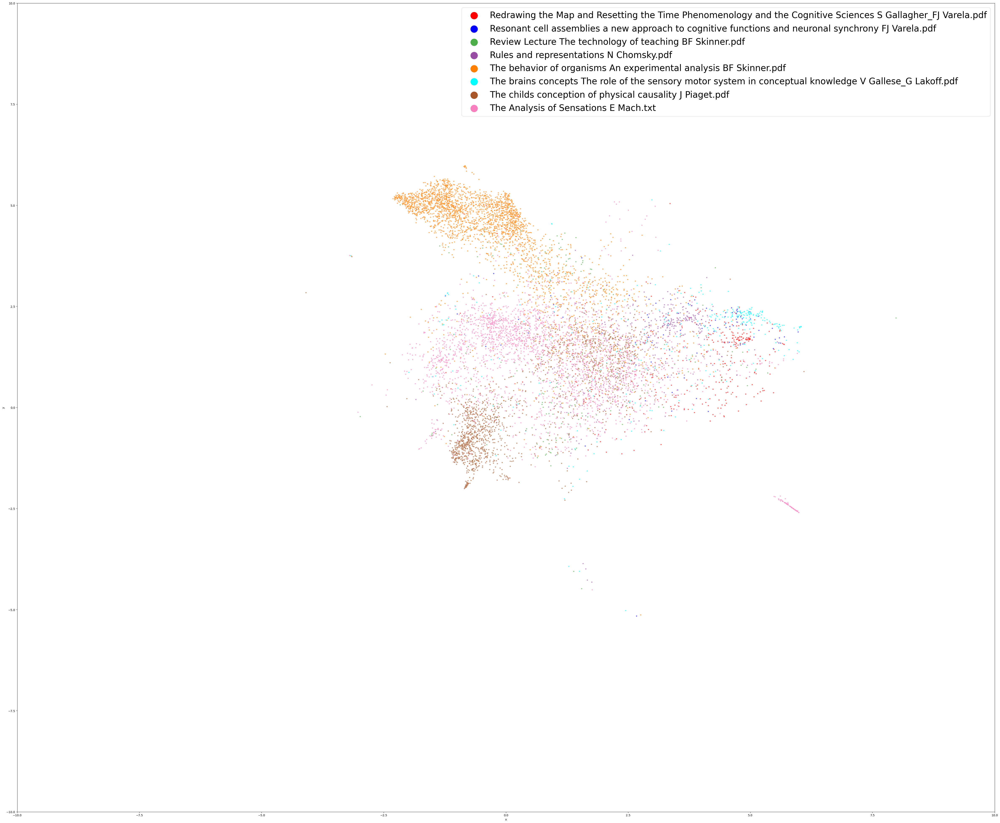

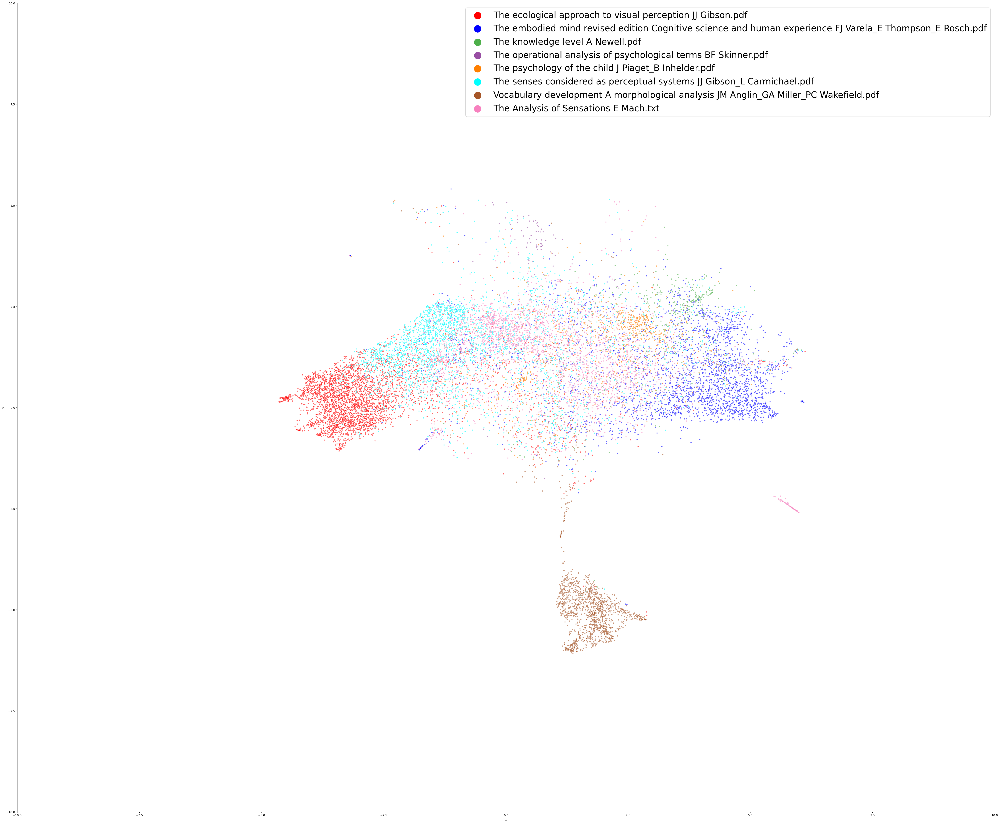

In [40]:
for i in range(n):
    
    group = groups[i]
    
    # now plot
    plt.figure(figsize=(60,50))

    # generate a list of colors for each file_name

    # divide df_text_vec_umap into 2 data frames (based on file_name)


    colors = sns.color_palette("Set1", len(group.file_name.unique()))
    
    # change yellow to different color
    colors[0] = '#ff0000'
    
    # change green to different color
    colors[1] = '#0000ff'
    
    # change purple to different color
    colors[5] = '#00ffff'

    # sns.scatterplot(x='x', y='y', hue='file_name', data=df_text_vec_umap, s=100, alpha=0.5)
    sns.scatterplot(data=group, x='x', y='y', 
                    hue='file_name', alpha=0.6, s=18, palette=colors) # adjust marker size => avoid overplotting
    plt.legend(loc='upper right', markerscale=4, fontsize=30)

    # zoom in on the interesting part
    plt.xlim(-10,10)
    plt.ylim(-10,10)

    # save plot
    plt.savefig(f'analysis/umap_sentences_group_{i}.png', dpi=300, bbox_inches='tight')

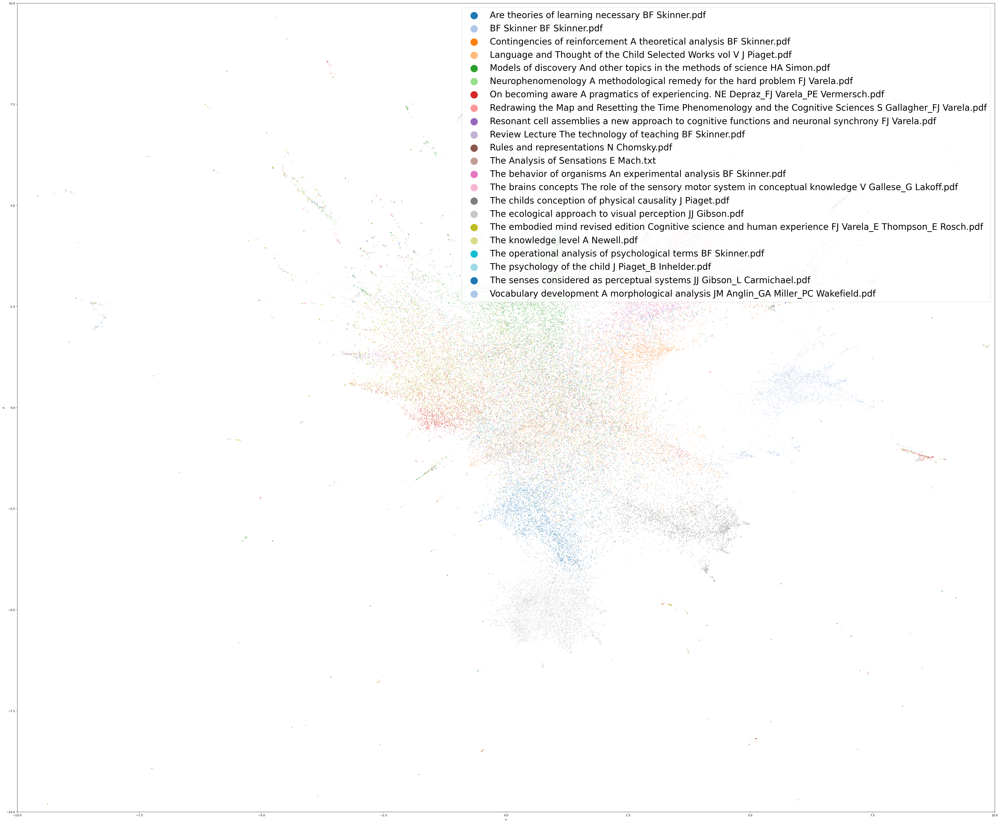

In [ ]:
# now plot
plt.figure(figsize=(60,50))

# generate a list of colors for each file_name

# divide df_text_vec_umap into 2 data frames (based on file_name)




colors = sns.color_palette("tab10", len(df_text_vec_umap.file_name.unique()))

# sns.scatterplot(x='x', y='y', hue='file_name', data=df_text_vec_umap, s=100, alpha=0.5)
sns.scatterplot(data=df_text_vec_umap, x='x', y='y', 
                hue='file_name', alpha=0.5, s=10, palette=colors) # adjust marker size => avoid overplotting
plt.legend(loc='upper right', markerscale=4, fontsize=30)

# zoom in on the interesting part
plt.xlim(-10,10)
plt.ylim(-10,10)

# save plot

plt.savefig('analysis/umap_sentences.png', dpi=300, bbox_inches='tight')

In [41]:
type(text_vec)
# delete .pdf and .txt from file_name in text_vec
data_as_df = text_vec.as_data_frame()

data_as_df['file_name'] = data_as_df['file_name'].str.replace('.pdf', '')
data_as_df['file_name'] = data_as_df['file_name'].str.replace('.txt', '')

C:\Users\jpast\AppData\Local\Temp\ipykernel_224156\4266258907.py:5: FutureWarning: The default value of regex will change from True to False in a future version.
  data_as_df['file_name'] = data_as_df['file_name'].str.replace('.pdf', '')
C:\Users\jpast\AppData\Local\Temp\ipykernel_224156\4266258907.py:6: FutureWarning: The default value of regex will change from True to False in a future version.
  data_as_df['file_name'] = data_as_df['file_name'].str.replace('.txt', '')


In [42]:
data_as_df['file_name'].unique()

array(['Are theories of learning necessary BF Skinner',
       'BF Skinner BF Skinner',
       'Contingencies of reinforcement A theoretical analysis BF Skinner',
       'Language and Thought of the Child Selected Works vol V J Piaget',
       'Models of discovery And other topics in the methods of science HA Simon',
       'Neurophenomenology A methodological remedy for the hard problem FJ Varela',
       'On becoming aware A pragmatics of experiencing. NE Depraz_FJ Varela_PE Vermersch',
       'Redrawing the Map and Resetting the Time Phenomenology and the Cognitive Sciences S Gallagher_FJ Varela',
       'Resonant cell assemblies a new approach to cognitive functions and neuronal synchrony FJ Varela',
       'Review Lecture The technology of teaching BF Skinner',
       'Rules and representations N Chomsky',
       'The Analysis of Sensations E Mach',
       'The behavior of organisms An experimental analysis BF Skinner',
       'The brains concepts The role of the sensory motor sys

In [43]:
text_vec= h2o.H2OFrame(data_as_df)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [44]:
# train/test split
random.seed(1234)
perc_train = 0.7
data_split = text_vec.split_frame(ratios=[perc_train]) 

In [45]:
# export to file - for potential external processing
h2o.export_file(data_split[0], 'df_train.csv')
h2o.export_file(data_split[1], 'df_test.csv')

Export File progress: |██████████████████████████████████████████████████████████| (done) 100%
Export File progress: |██████████████████████████████████████████████████████████| (done) 100%


In [46]:
# define gradient boosting model


n_CV = 5 # number of cross validations
fit_1 = H2OGradientBoostingEstimator(ntrees=200,
                                     max_depth=4,
                                     col_sample_rate=0.5,
                                     min_rows=10,
                                     nfolds=n_CV,
                                     seed=999)

In [47]:
import time

In [48]:
# train model
t1 = time.time()
fit_1.train(x = features,
                y = "file_name",
                training_frame = data_split[0],
                validation_frame = data_split[1])
t2 = time.time()
print('Elapsed time:', np.round(t2-t1,2), 'secs')

gbm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%
Elapsed time: 421.94 secs


In [49]:
# show cross validation metrics
fit_1.cross_validation_metrics_summary()

,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
accuracy,0.7048063,0.0090107,0.7093531,0.7170612,0.6942022,0.6983708,0.7050439
auc,nan,0.0,nan,nan,nan,nan,nan
err,0.2951938,0.0090107,0.2906469,0.2829388,0.3057977,0.3016293,0.2949561
err_count,1343.0,50.690235,1330.0,1267.0,1403.0,1370.0,1345.0
logloss,1.0400112,0.0241297,1.0285281,1.0231407,1.0761049,1.0531673,1.019115
max_per_class_error,1.0,0.0,1.0,1.0,1.0,1.0,1.0
mean_per_class_accuracy,0.4735891,0.0129863,0.4775932,0.4874771,0.4701958,0.4531290,0.4795503
mean_per_class_error,0.5264109,0.0129863,0.5224068,0.5125229,0.5298042,0.546871,0.5204497
mse,0.283581,0.0061757,0.28174,0.2768370,0.2926617,0.2865817,0.2800845
pr_auc,nan,0.0,nan,nan,nan,nan,nan


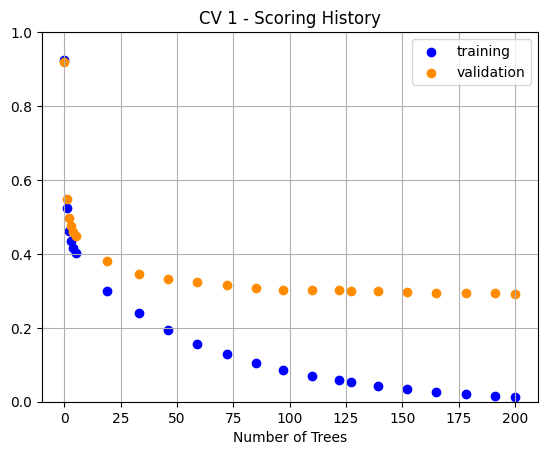

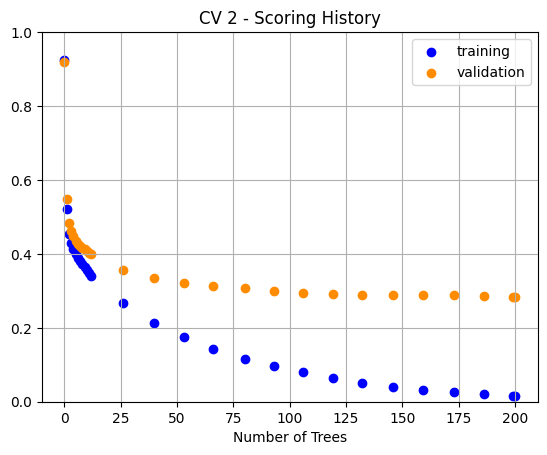

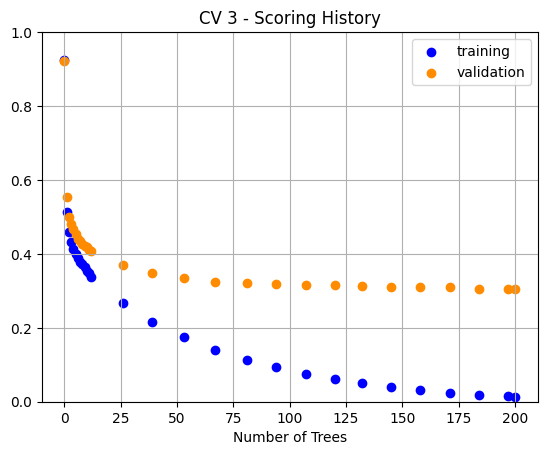

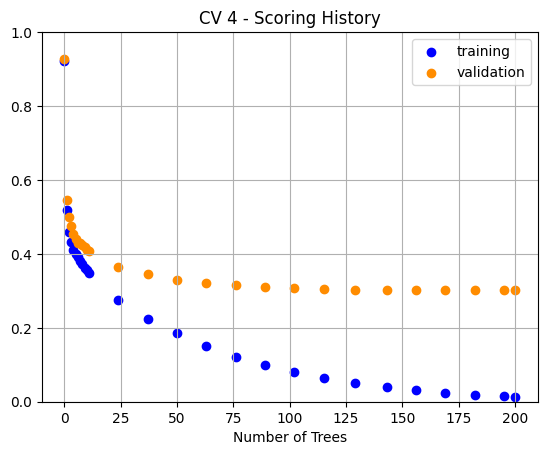

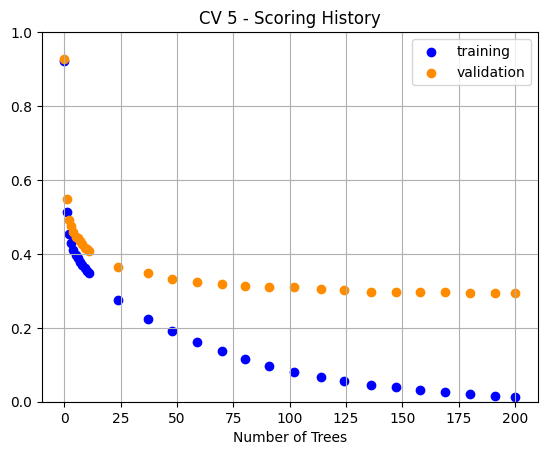

In [50]:
# show scoring history - training vs cross validation
for i in range(n_CV):
    cv_model_temp = fit_1.cross_validation_models()[i]
    df_cv_score_history = cv_model_temp.score_history()
    my_title = 'CV ' + str(1+i) + ' - Scoring History'
    plt.scatter(df_cv_score_history.number_of_trees,
                y=df_cv_score_history.training_classification_error, 
                c='blue', label='training')
    plt.scatter(df_cv_score_history.number_of_trees,
                y=df_cv_score_history.validation_classification_error, 
                c='darkorange', label='validation')
    plt.ylim(0,1)
    plt.title(my_title)
    plt.xlabel('Number of Trees')
    plt.legend()
    plt.grid()
    plt.show()

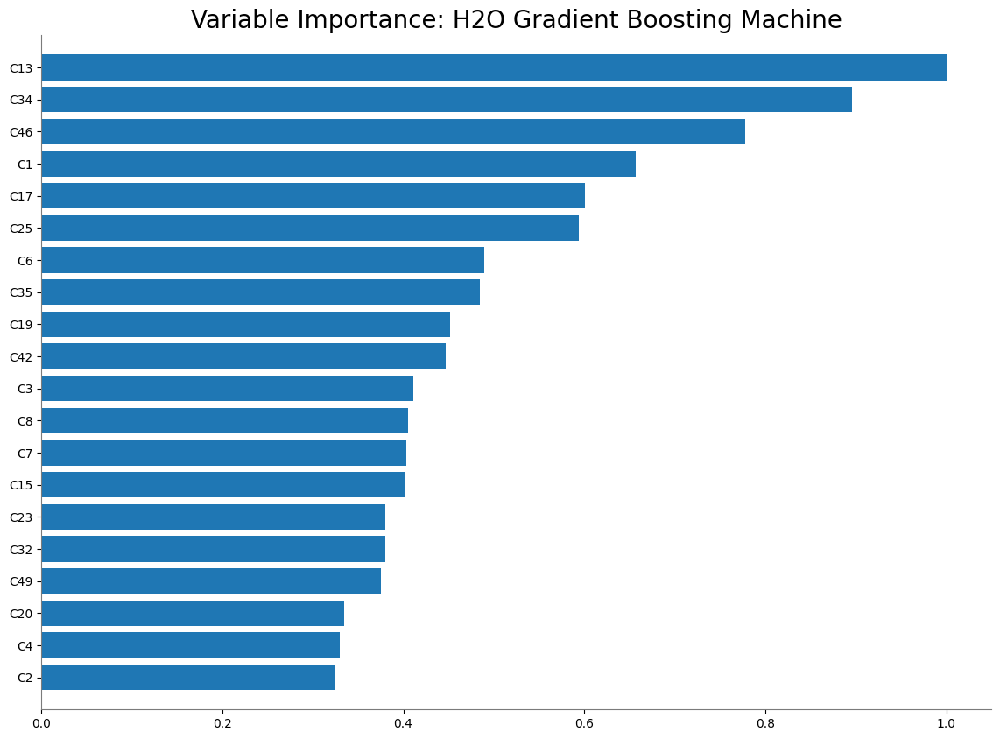

<Figure size 640x480 with 0 Axes>

In [51]:
# variable importance
fit_1.varimp_plot(20)

In [52]:
# predictions on validation set
pred_valid = fit_1.predict(data_split[1])
pred_valid = pred_valid.as_data_frame() # back to pandas

# show preview
pred_valid.head()

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


,predict,Are theories of learning necessary BF Skinner,BF Skinner BF Skinner,Contingencies of reinforcement A theoretical analysis BF Skinner,Language and Thought of the Child Selected Works vol V J Piaget,Models of discovery And other topics in the methods of science HA Simon,Neurophenomenology A methodological remedy for the hard problem FJ Varela,On becoming aware A pragmatics of experiencing. NE Depraz_FJ Varela_PE Vermersch,Redrawing the Map and Resetting the Time Phenomenology and the Cognitive Sciences S Gallagher_FJ Varela,Resonant cell assemblies a new approach to cognitive functions and neuronal synchrony FJ Varela,...,The behavior of organisms An experimental analysis BF Skinner,The brains concepts The role of the sensory motor system in conceptual knowledge V Gallese_G Lakoff,The childs conception of physical causality J Piaget,The ecological approach to visual perception JJ Gibson,The embodied mind revised edition Cognitive science and human experience FJ Varela_E Thompson_E Rosch,The knowledge level A Newell,The operational analysis of psychological terms BF Skinner,The psychology of the child J Piaget_B Inhelder,The senses considered as perceptual systems JJ Gibson_L Carmichael,Vocabulary development A morphological analysis JM Anglin_GA Miller_PC Wakefield
0,The embodied mind revised edition Cognitive sc...,0.001324,0.000172,0.016103,0.002083,0.035179,0.001092,0.025356,0.002888,0.000602,...,0.004513,0.019999,0.004450,0.011667,0.658373,0.010051,0.000034,0.006231,0.108749,0.000140
1,Contingencies of reinforcement A theoretical a...,0.011416,0.005402,0.448145,0.003845,0.077619,0.002381,0.016025,0.000778,0.000046,...,0.049534,0.001745,0.004172,0.036890,0.026436,0.001188,0.028959,0.000689,0.144185,0.002505
2,On becoming aware A pragmatics of experiencing...,0.001361,0.002139,0.050030,0.110313,0.029009,0.000471,0.333221,0.000416,0.000040,...,0.010220,0.003775,0.107490,0.011635,0.089206,0.001053,0.000449,0.002593,0.009619,0.001377
3,Models of discovery And other topics in the me...,0.006278,0.000236,0.228331,0.002620,0.601190,0.000616,0.037719,0.000168,0.000371,...,0.002916,0.003970,0.003563,0.006073,0.028981,0.001317,0.000154,0.007534,0.018680,0.010941
4,Contingencies of reinforcement A theoretical a...,0.007229,0.000638,0.889253,0.002279,0.001465,0.000423,0.007060,0.000423,0.000002,...,0.049288,0.000764,0.000567,0.003550,0.005487,0.000151,0.000615,0.001982,0.018583,0.000047


In [53]:
# actual values on validation set
actuals = data_split[1]['file_name'].as_data_frame()
actuals = actuals.file_name

In [54]:
actuals

0           Are theories of learning necessary BF Skinner
1           Are theories of learning necessary BF Skinner
2           Are theories of learning necessary BF Skinner
3           Are theories of learning necessary BF Skinner
4           Are theories of learning necessary BF Skinner
                              ...                        
9896    Vocabulary development A morphological analysi...
9897    Vocabulary development A morphological analysi...
9898    Vocabulary development A morphological analysi...
9899    Vocabulary development A morphological analysi...
9900    Vocabulary development A morphological analysi...
Name: file_name, Length: 9901, dtype: object

In [55]:
pred_valid.shape

(9901, 23)

In [56]:
actuals.shape

(9901,)

In [57]:
len(pred_valid)

9901

In [75]:
# evaluate confusion matrix
conf_valid = pd.crosstab( pred_valid.predict, actuals, rownames=['Predicted'], colnames=['Actual'])

In [76]:
actuals.head()

0    Are theories of learning necessary BF Skinner
1    Are theories of learning necessary BF Skinner
2    Are theories of learning necessary BF Skinner
3    Are theories of learning necessary BF Skinner
4    Are theories of learning necessary BF Skinner
Name: file_name, dtype: object

In [77]:
conf_valid.head()

Actual,Are theories of learning necessary BF Skinner,BF Skinner BF Skinner,Contingencies of reinforcement A theoretical analysis BF Skinner,Language and Thought of the Child Selected Works vol V J Piaget,Models of discovery And other topics in the methods of science HA Simon,Neurophenomenology A methodological remedy for the hard problem FJ Varela,On becoming aware A pragmatics of experiencing. NE Depraz_FJ Varela_PE Vermersch,Redrawing the Map and Resetting the Time Phenomenology and the Cognitive Sciences S Gallagher_FJ Varela,Resonant cell assemblies a new approach to cognitive functions and neuronal synchrony FJ Varela,Review Lecture The technology of teaching BF Skinner,...,The behavior of organisms An experimental analysis BF Skinner,The brains concepts The role of the sensory motor system in conceptual knowledge V Gallese_G Lakoff,The childs conception of physical causality J Piaget,The ecological approach to visual perception JJ Gibson,The embodied mind revised edition Cognitive science and human experience FJ Varela_E Thompson_E Rosch,The knowledge level A Newell,The operational analysis of psychological terms BF Skinner,The psychology of the child J Piaget_B Inhelder,The senses considered as perceptual systems JJ Gibson_L Carmichael,Vocabulary development A morphological analysis JM Anglin_GA Miller_PC Wakefield
Predicted,,,,,,,,,,,,,,,,,,,,,
Are theories of learning necessary BF Skinner,9,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
BF Skinner BF Skinner,0,15,5,2,1,0,2,0,0,0,...,0,0,0,1,0,0,0,0,4,1
Contingencies of reinforcement A theoretical analysis BF Skinner,13,23,470,20,40,4,18,2,0,39,...,67,3,3,4,23,3,23,10,32,1
Language and Thought of the Child Selected Works vol V J Piaget,0,8,14,413,12,1,17,1,0,3,...,2,1,73,1,16,0,2,28,10,9
Models of discovery And other topics in the methods of science HA Simon,5,2,33,26,1084,1,25,3,3,1,...,38,10,13,2,45,53,5,18,19,9


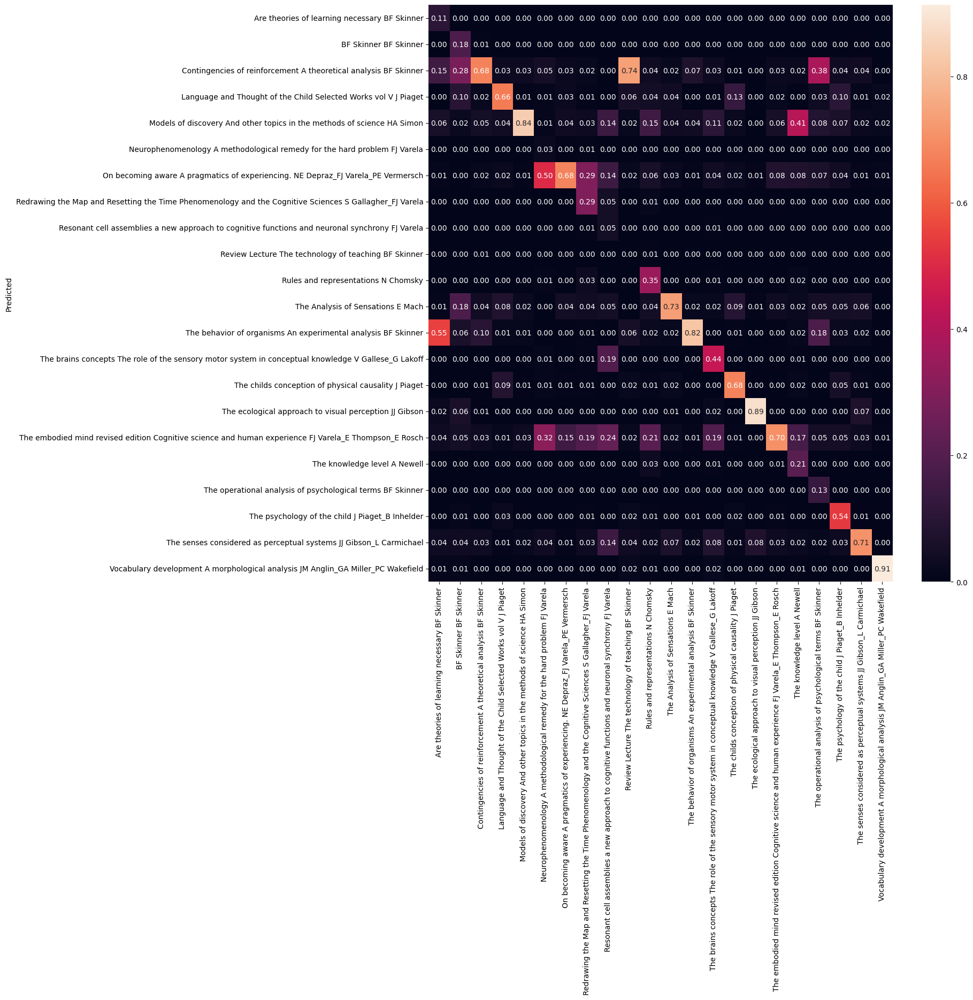

In [78]:
# visualize confusion matrix (validation set) proportionally to actuals for each file_name
plt.figure(figsize=(14,14))
sns.heatmap(conf_valid/actuals.value_counts(), annot=True, fmt=".2f")

plt.savefig('analysis/confusion_matrix.png', dpi=300, bbox_inches='tight')
# sns.heatmap(data=conf_valid, annot=True, fmt='g', cmap='Blues')
# plt.show()


## LDA

In [ ]:
import gensim.corpora as corpora
# Create Dictionary
id2word = corpora.Dictionary(data_words)
# Create Corpus
texts = data_words
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

In [ ]:
import gensim.corpora as corpora
# Create Dictionary
id2word = corpora.Dictionary(data_words)
# Create Corpus
texts = data_words
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

In [ ]:
import pyLDAvis.gensim
import pickle 
import pyLDAvis
# Visualize the topics
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+str(num_topics))
# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
if 1 == 1:
    LDAvis_prepared = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared